In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import scipy
from mpl_toolkits.basemap import Basemap
import eofs.xarray as Eof
plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'retina'
from sklearn.decomposition import PCA

In [2]:
def basemap_base(name_projection,axes,lat,lon,latS,latN,lonL,lonR):
    m = Basemap(projection=name_projection,
                llcrnrlat=latS,urcrnrlat=latN,\
                llcrnrlon=lonL,urcrnrlon=lonR,resolution='l',ax=axes)

    lon2, lat2 = np.meshgrid(lon,lat)
    x, y = m(lon2,lat2)

    m.fillcontinents(color='grey',lake_color='gray')
    m.drawcoastlines(linewidth=0.5)
    m.drawparallels(np.arange(-80.,81.,20.), 
                    labels = [1,0,0,0],fontsize = 15,color = 'grey',linewidth = 0.6 )
    m.drawmeridians(np.arange(-180.,181.,30.),
                    labels = [0,0,0,1],fontsize = 15,color = 'grey',linewidth = 0.6 )
    m.drawmapboundary(fill_color='white')
    
    return m, x, y;

## 1. Read the SST data (NCEP Reanalysis)

In [3]:
dir_name  = "./DATA/"
file_name = "sst_anom.mon.mean.nc"
path_name = dir_name+file_name

f         = xr.open_dataset(path_name)

sst       = f.sst  ## SST (Sea Surface Temperature) [C]
lat       = f.lat  ## Latitude  [^o]
lon       = f.lon  ## Longitude [^o]
time      = f.time ## Time      [Month]

### 1-1) Slice the latitude / logitude / time

In [4]:
latS = -30.     ; latN = 30.
lonL = 110.     ; lonR = 290.
year_str = 1982 ; year_end = 2020

In [5]:
## Find the time index for speicified year
ind_year = np.where((time.dt.year>=year_str) & 
                    (time.dt.year<=year_end))[0]

## Slice the SST array for specified time, latitude and longitude
sst_slice = sst.sel(lat=slice(latN,latS),lon=slice(lonL,lonR))[ind_year,:,:]
Nt, Ny, Nx = sst_slice.shape

### 1-2) Make the SST array to 2D matrix

### $X'=\begin{bmatrix}
            x'_{1,1,1} & x'_{1,2,1} & \cdots & x'_{1,Nx,1} & x'_{1,1,2} &  \cdots & x'_{1,Nx-1,Ny} & x'_{1,Nx,Ny} \\
            x'_{2,1,1} & x'_{2,2,1} & \cdots & x'_{2,Nx,1} & x'_{2,1,2} & \cdots & x'_{2,Nx-1,Ny} & x'_{2,Nx,Ny} \\            
            \vdots & \vdots & \vdots & \vdots  & \vdots & \vdots  & \vdots & \vdots \\
            x'_{Nt,1,1} & x'_{Nt,2,1} & \cdots & x'_{Nt,Nx,1} & x'_{Nt,1,2} &  \cdots & x'_{Nt,Nx-1,Ny} & x'_{Nt,Nx,Ny} 
            \end{bmatrix}$

In [6]:
## Convert the array to 2D matrix
sst_2D   = sst_slice.values.reshape(Nt,-1)

## Find the non-NaN values and reduce the matrix
ind_nnan = np.where(~np.isnan(sst_2D[0,:]))[0]
sst_2D_nnan = sst_2D[:,ind_nnan]

Nt, Ns = sst_2D_nnan.shape

### 1-3) Make the Covariance matrix

### $C_{Nt \times Nt} = X' \cdot X'^T $
### $C_{Ns \times Ns} = X'^T \cdot X' $

In [7]:
tmp_matrix = sst_2D_nnan
cov_1 = np.dot(tmp_matrix,tmp_matrix.T)
cov_2 = np.dot(tmp_matrix.T,tmp_matrix)

# cov_1_np = np.cov(tmp_matrix.T,bias=True,rowvar=0)
# cov_2 = np.cov(tmp_matrix.T,bias=True,rowvar=0)

## 2. Conduct the EOF & PCA Decomposition
### (Empirical Orthogonal Functions & Principal Component Analysis)

In [10]:
eigval_cov_1,eigvec_cov_1 = np.linalg.eig(cov_1/(Nt*Ns))
eigval_cov_2,eigvec_cov_2 = np.linalg.eig(cov_2/(Nt*Ns))

In [11]:
TS_cov_1 = eigvec_cov_1
SP_cov_1 = np.dot(tmp_matrix.T,eigvec_cov_1)

SP_cov_2 = eigvec_cov_2
TS_cov_2 = np.dot(tmp_matrix,eigvec_cov_2)

In [12]:
for it in range(9):
    print("Eigenvalue PC{}: {:4.3f},  {:4.3f}, {:4.2f}".format(it+1,
                                              np.real(eigval_cov_1[it]),
                                              np.real(eigval_cov_2[it]),
                                              np.real(np.corrcoef(TS_cov_1[:,it],TS_cov_2[:,it])[0,1])))

Eigenvalue PC1: 0.139,  0.139, -1.00
Eigenvalue PC2: 0.036,  0.036, 1.00
Eigenvalue PC3: 0.018,  0.018, -1.00
Eigenvalue PC4: 0.016,  0.016, -1.00
Eigenvalue PC5: 0.013,  0.013, -1.00
Eigenvalue PC6: 0.010,  0.010, 1.00
Eigenvalue PC7: 0.009,  0.009, 1.00
Eigenvalue PC8: 0.007,  0.007, -1.00
Eigenvalue PC9: 0.006,  0.006, 1.00


## 3. Plot PCA & EOF Statistics

### 3-1) Plot the Variance Ratio fo each PC

In [14]:
N_comp = 5 

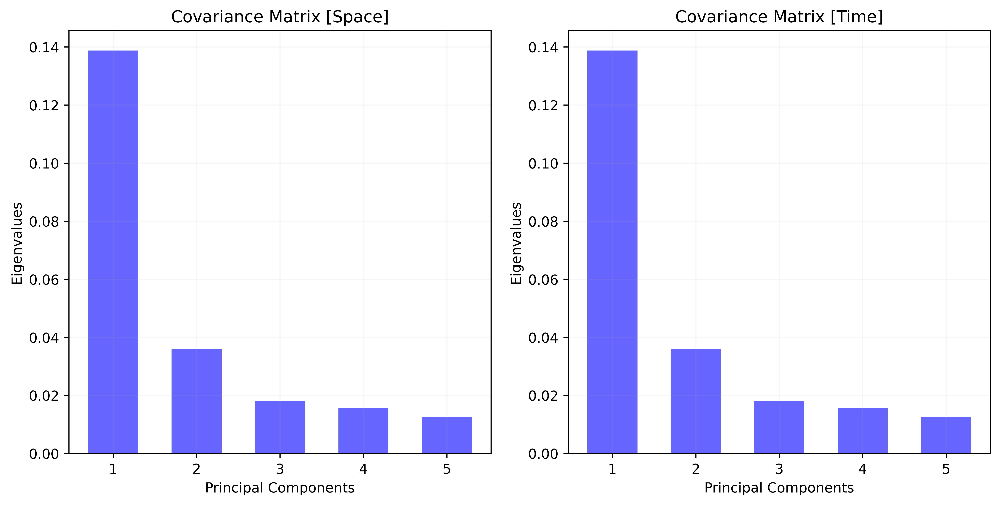

In [15]:
figs,axes = plt.subplots(1,2,figsize=(10,5),constrained_layout=True)
axes[0].bar(np.linspace(1,N_comp,N_comp),eigval_cov_1[0:N_comp],
                     color='b',width=0.6,alpha=0.6)

axes[1].bar(np.linspace(1,N_comp,N_comp),eigval_cov_2[0:N_comp],
                     color='b',width=0.6,alpha=0.6)

for ind_ax in range(2):
    axes[ind_ax].set_xlabel("Principal Components")
    axes[ind_ax].set_ylabel("Eigenvalues")
    axes[ind_ax].grid(alpha=0.1)

axes[0].set_title("Covariance Matrix [Space]")
axes[1].set_title("Covariance Matrix [Time]")

plt.savefig("Eigenvalues_PC.pdf")

### 3-2) Plot the PC Time Series

In [17]:
fig, axes = plt.subplots(4,2,figsize=(20,12),constrained_layout=True)

for ind_PC in range(4):
    ## Specify the input parameters for PC time series [Covariance Matrix]
    ind_pos = np.where(-TS_cov_1[:,ind_PC]>=0)[0]
    ind_neg = np.where(-TS_cov_1[:,ind_PC]<0)[0]

    if (ind_PC == 1): tmp_TS = -TS_cov_1[:,ind_PC]
    else:             tmp_TS = -TS_cov_1[:,ind_PC]
        
    std_PC = TS_cov_1[:,ind_PC].std()
    eig_PC = np.real(eigval_cov_1)
    
    ## Plot PC Time Series    
    axes[ind_PC][0].bar(time[ind_year][ind_pos],tmp_TS[ind_pos],
                     width=3e+1,color='r',alpha=0.7)
    axes[ind_PC][0].bar(time[ind_year][ind_neg],tmp_TS[ind_neg],
                     width=3e+1,color='b',alpha=0.7) 
    
    ## Specifiy the Plot options
    axes[ind_PC][0].set_xlabel("Time [Year]")
    axes[ind_PC][0].set_ylabel("Amplitude")
    axes[ind_PC][0].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100))
    axes[ind_PC][0].grid(alpha=0.2)
    axes[ind_PC][0].set_ylim([-0.15,0.15])
    
    ## Specify the input parameters for PC time series [Correlation Matrix]
    if (ind_PC == 1):
        ind_pos = np.where(-TS_cov_2[:,ind_PC]>=0)[0]
        ind_neg = np.where(-TS_cov_2[:,ind_PC]<0)[0]    
    else:
        ind_pos = np.where(TS_cov_2[:,ind_PC]>=0)[0]
        ind_neg = np.where(TS_cov_2[:,ind_PC]<0)[0]  
        
    if (ind_PC == 1): tmp_TS = -TS_cov_2[:,ind_PC]
    else:             tmp_TS = TS_cov_2[:,ind_PC]

    std_PC = TS_cov_2[:,ind_PC].std()
    eig_PC = np.real(eigval_cov_2)
    
    ## Plot PC Time Series    
    axes[ind_PC][1].bar(time[ind_year][ind_pos],tmp_TS[ind_pos],
                     width=3e+1,color='r',alpha=0.7)
    axes[ind_PC][1].bar(time[ind_year][ind_neg],tmp_TS[ind_neg],
                     width=3e+1,color='b',alpha=0.7) 
    
    ## Specifiy the Plot options
    axes[ind_PC][1].set_xlabel("Time [Year]")
    axes[ind_PC][1].set_ylabel("Amplitude")
    axes[ind_PC][1].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100))
    axes[ind_PC][1].grid(alpha=0.2)
    axes[ind_PC][1].set_ylim([-100,100])
                             
plt.savefig("./PC_Time_Series.pdf")

### 3-3) Plot the PC Spatial Pattern for each PC [Covariance]

In [18]:
fig, axes = plt.subplots(4,2,figsize=(30,20),constrained_layout=True)

for ind_PC in range(4):
    sst_recon_1D    = np.empty([Ny*Nx])
    sst_recon_1D[:] = np.NaN
    
    eig_PC = np.real(eigval_cov_1)
    sst_recon_1D[ind_nnan] = SP_cov_1[:,ind_PC]

    if (ind_PC==1): tmp_var = -sst_recon_1D.reshape(Ny,Nx)
    else:           tmp_var = -sst_recon_1D.reshape(Ny,Nx)

    m, x, y = basemap_base('cyl',axes[ind_PC][0],lat.sel(lat=slice(latN,latS)),
                                              lon.sel(lon=slice(lonL,lonR)),
                                              latS,latN,lonL,lonR)

    vmin   = -1.5e+1 ; vmax  = 1.5e+1

    levels    = 20    ; level_boundaries = np.linspace(vmin,vmax,levels+1)

    contour_var_1 = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')
    axes[ind_PC][0].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100),fontsize=20)
    
    eig_PC = np.real(eigval_cov_2)
    sst_recon_1D[ind_nnan] = SP_cov_2[:,ind_PC]
    if (ind_PC==1): tmp_var = -sst_recon_1D.reshape(Ny,Nx)
    else:           tmp_var = sst_recon_1D.reshape(Ny,Nx)

    m, x, y = basemap_base('cyl',axes[ind_PC][1],lat.sel(lat=slice(latN,latS)),
                                              lon.sel(lon=slice(lonL,lonR)),
                                              latS,latN,lonL,lonR)
    vmin   = -3.5e-2 ; vmax  = 3.5e-2

    levels    = 20    ; level_boundaries = np.linspace(vmin,vmax,levels+1)

    contour_var_2 = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')
    axes[ind_PC][1].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100),fontsize=20)

cb = fig.colorbar(contour_var_1,ax=axes[:,0],shrink=0.65) ; cb.ax.tick_params(labelsize=15.5)
cb = fig.colorbar(contour_var_2,ax=axes[:,1],shrink=0.65) ; cb.ax.tick_params(labelsize=15.5)


plt.savefig("./Spatial_Pattern_Covariance.pdf")